In [1]:
import torchvision 
from torchvision import transforms 
import torch 
from torch import no_grad

In [2]:
import requests

In [3]:
import cv2 
import numpy as np 
from PIL import Image 
import matplotlib.pyplot as plt

In [4]:
# If kernal showing dead----use below command
import os 
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [5]:
# !conda install pytorch=1.1.0 torchvision -c pytorch -y

In [6]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True) 
model_.eval()

for name, param in model_.named_parameters(): 
    param.requires_grad = False 
print("done")

C:\Users\shabaz\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\shabaz\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


done


In [7]:
def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold 
    
    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    thre
    """


    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]
    
    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

In [8]:
def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object 
    
    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface 
   
    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:
      
      label=predicted_class[0]
      probability=predicted_class[1]
      box=predicted_class[2]
      t = round(box[0][0].tolist())
      l = round(box[0][1].tolist())
      r = round(box[1][0].tolist())
      b = round(box[1][1].tolist())

      # Giving brief information about rectange, class and probability.
      from colorama import Fore
      from colorama import Style
      print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
      print(f"Box coordinates: {t}, {l}, {r}, {b}")
      print(f"Probability: {probability}")

      # Drawing rectangle and adding text on the picture based on their class and size.
      cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
      cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
      cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, 
                  text_size, (0,255,0), thickness=text_th)
      cv2.putText(image, label+": "+str(round(probability, 2)), 
                  (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size, 
                  (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if download_image:
      plt.savefig(f'{img_name}.png')
    else:
      pass
    plt.show()
    
    del(img)
    del(image)

In [9]:
def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

In [10]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT') 
model_.eval()

for name, param in model_.named_parameters(): 
    param.requires_grad = False 
print("done")

done


In [11]:
def model(x): 
    with torch.no_grad(): 
        yhat = model_(x) 
    return yhat

In [12]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
len(COCO_INSTANCE_CATEGORY_NAMES)

91

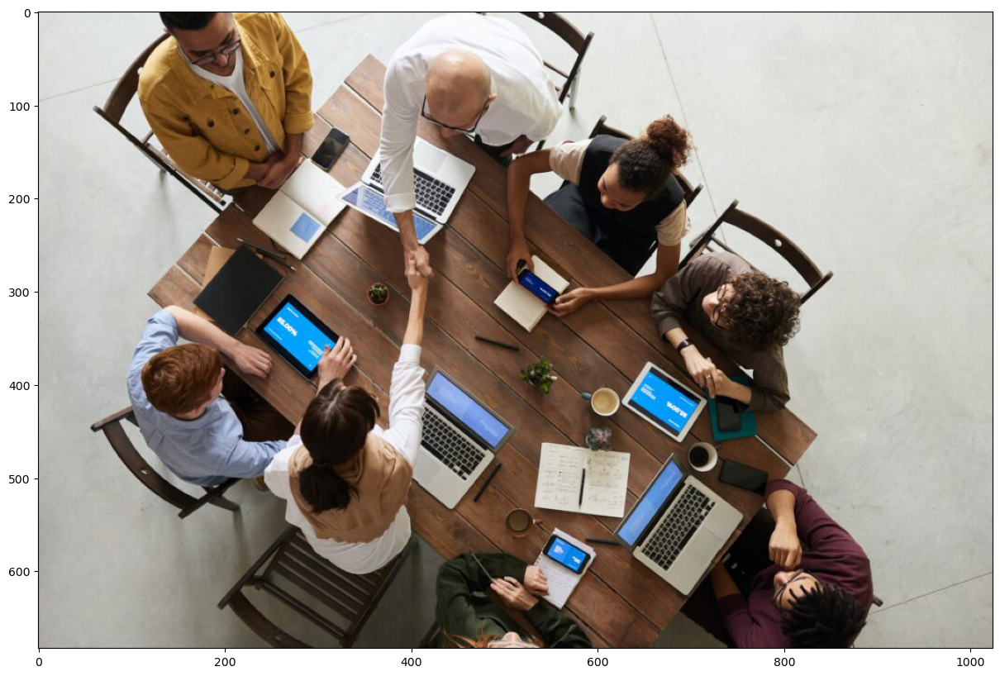

In [19]:
img_path='obj1.jpg'
half = 0.5
image = Image.open(img_path)

image.resize([int(half * s) for s in image.size] )
plt.figure(figsize=(15, 10))
plt.imshow(image)
plt.show()

In [20]:
transform = transforms.Compose([transforms.ToTensor()])

In [21]:
img = transform(image)

In [22]:
img

tensor([[[0.8706, 0.8745, 0.8745,  ..., 0.8392, 0.8353, 0.8314],
         [0.8706, 0.8706, 0.8706,  ..., 0.8431, 0.8353, 0.8314],
         [0.8667, 0.8667, 0.8706,  ..., 0.8431, 0.8353, 0.8353],
         ...,
         [0.6627, 0.6745, 0.6627,  ..., 0.6431, 0.6471, 0.6471],
         [0.6588, 0.6745, 0.6667,  ..., 0.6431, 0.6471, 0.6471],
         [0.6549, 0.6745, 0.6667,  ..., 0.6431, 0.6471, 0.6471]],

        [[0.8784, 0.8824, 0.8824,  ..., 0.8431, 0.8392, 0.8353],
         [0.8784, 0.8784, 0.8784,  ..., 0.8471, 0.8392, 0.8353],
         [0.8745, 0.8745, 0.8784,  ..., 0.8471, 0.8392, 0.8392],
         ...,
         [0.6510, 0.6627, 0.6510,  ..., 0.6314, 0.6353, 0.6353],
         [0.6471, 0.6627, 0.6549,  ..., 0.6314, 0.6353, 0.6353],
         [0.6431, 0.6627, 0.6549,  ..., 0.6314, 0.6353, 0.6353]],

        [[0.8667, 0.8706, 0.8706,  ..., 0.8196, 0.8157, 0.8118],
         [0.8667, 0.8667, 0.8667,  ..., 0.8235, 0.8157, 0.8118],
         [0.8627, 0.8627, 0.8667,  ..., 0.8235, 0.8157, 0.

In [23]:
pred=model([img])

In [24]:
len(pred[0]['labels'])

98

In [25]:
pred[0]['labels']

tensor([ 1,  1,  1,  1,  1, 73, 62,  1, 73, 73,  1, 73, 77,  1, 37, 47, 72,  1,
        47,  1, 62, 77, 62, 76, 56, 73, 62, 77, 77, 49, 64, 62, 67, 44, 73,  1,
         1, 72, 76, 47,  1, 62, 84, 15, 67, 31,  1, 73, 73, 62, 62,  1, 73, 51,
        84,  1,  1,  1,  1, 47, 62, 37,  1, 73, 50, 31, 62, 43, 72, 84, 73, 72,
        62, 72, 62, 73, 62, 82, 87, 85, 75, 73, 72, 84,  1, 62,  1, 47, 47,  1,
        40, 72, 65, 31, 56, 51, 76, 73])

In [26]:
pred[0]['scores']

tensor([0.9957, 0.9807, 0.9795, 0.9618, 0.9614, 0.9609, 0.9520, 0.9480, 0.9455,
        0.9450, 0.9392, 0.8990, 0.8916, 0.8903, 0.8689, 0.8642, 0.8434, 0.8420,
        0.8095, 0.7647, 0.7583, 0.7542, 0.6592, 0.6147, 0.5991, 0.5946, 0.5816,
        0.5633, 0.4783, 0.4523, 0.4435, 0.3267, 0.3252, 0.3125, 0.2955, 0.2777,
        0.2757, 0.2700, 0.2613, 0.2577, 0.2393, 0.2311, 0.2186, 0.2166, 0.2151,
        0.2011, 0.2004, 0.1988, 0.1902, 0.1901, 0.1779, 0.1653, 0.1591, 0.1363,
        0.1330, 0.1314, 0.1306, 0.1298, 0.1253, 0.1179, 0.1136, 0.1102, 0.1095,
        0.1072, 0.1035, 0.0979, 0.0965, 0.0964, 0.0941, 0.0908, 0.0895, 0.0857,
        0.0837, 0.0796, 0.0756, 0.0743, 0.0706, 0.0705, 0.0687, 0.0662, 0.0653,
        0.0641, 0.0621, 0.0612, 0.0611, 0.0607, 0.0606, 0.0600, 0.0591, 0.0581,
        0.0572, 0.0571, 0.0559, 0.0553, 0.0523, 0.0514, 0.0505, 0.0503])

In [27]:
index=pred[0]['labels'][0].item()
COCO_INSTANCE_CATEGORY_NAMES[index]

'person'

In [28]:
bounding_box=pred[0]['boxes'][0].tolist()
bounding_box

[104.97747802734375, 1.0237352848052979, 302.0063171386719, 198.17564392089844]

In [29]:
t, l, r, b = [round(x) for x in bounding_box]
print(t, l, r, b)

105 1 302 198


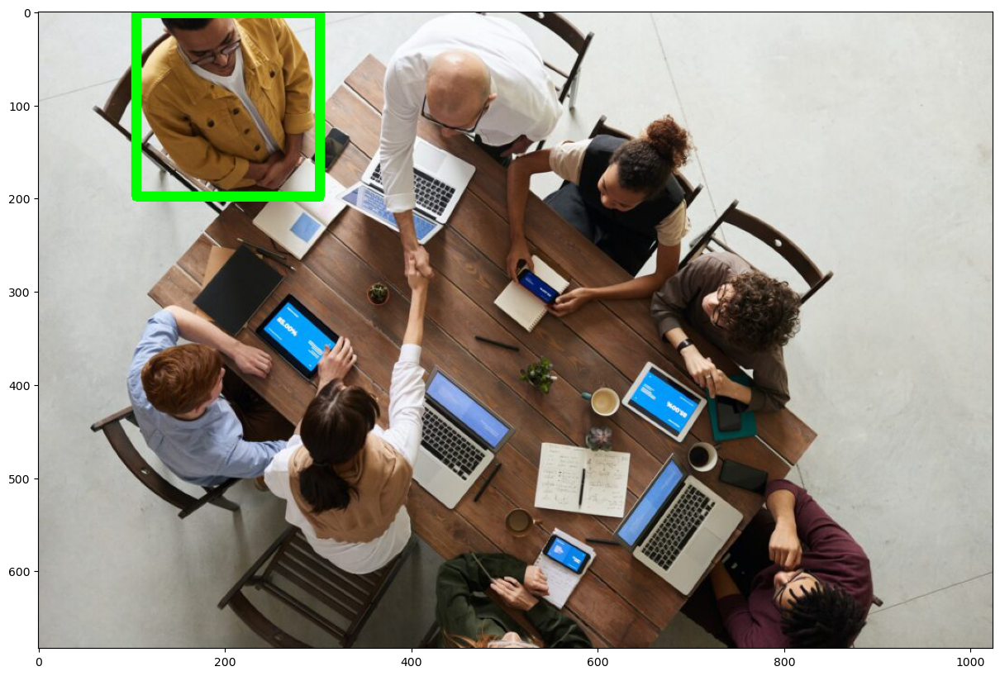

In [30]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b


Label: person
Box coordinates: 105, 1, 302, 198
Probability: 0.9957494735717773

Label: person
Box coordinates: 104, 353, 275, 516
Probability: 0.9807018637657166

Label: person
Box coordinates: 503, 121, 702, 311
Probability: 0.9795078635215759

Label: person
Box coordinates: 657, 257, 829, 440
Probability: 0.9618054032325745

Label: person
Box coordinates: 220, 306, 415, 615
Probability: 0.9614267349243164

Label: person
Box coordinates: 646, 245, 888, 671
Probability: 0.9480459094047546

Label: person
Box coordinates: 708, 495, 898, 676
Probability: 0.9392085671424866

Label: person
Box coordinates: 421, 559, 603, 676
Probability: 0.8902552127838135

Label: person
Box coordinates: 356, 11, 656, 311
Probability: 0.8419786691665649


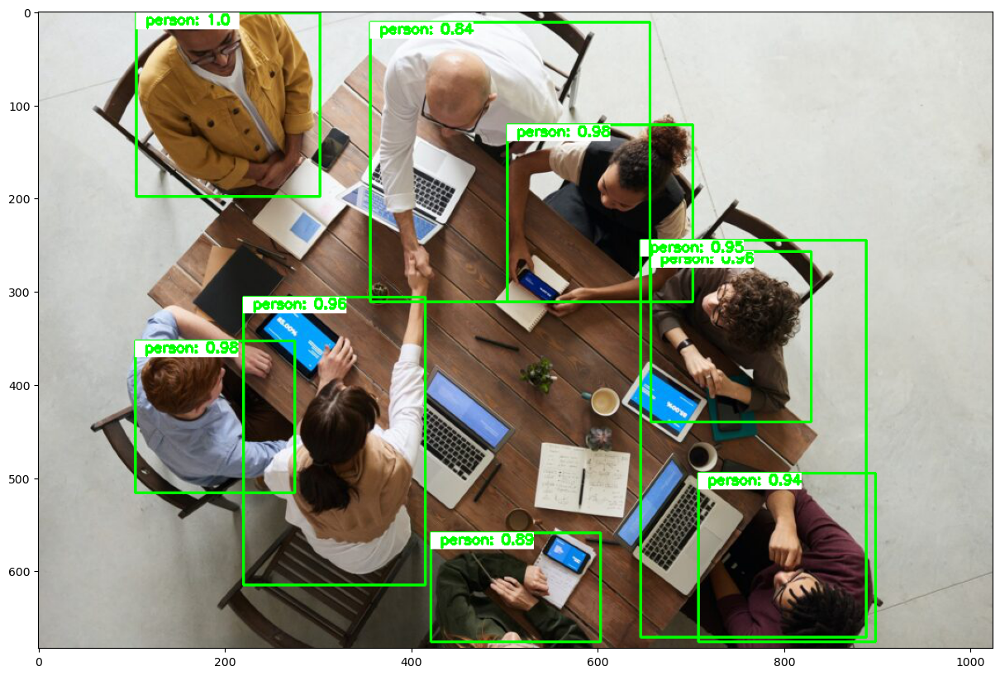

In [31]:
pred_class=get_predictions(pred, objects="person")
draw_box(pred_class, img)

del pred_class

In [32]:
get_predictions(pred, threshold=1, objects="person")

[]


Label: person
Box coordinates: 105, 1, 302, 198
Probability: 0.9957494735717773

Label: person
Box coordinates: 104, 353, 275, 516
Probability: 0.9807018637657166


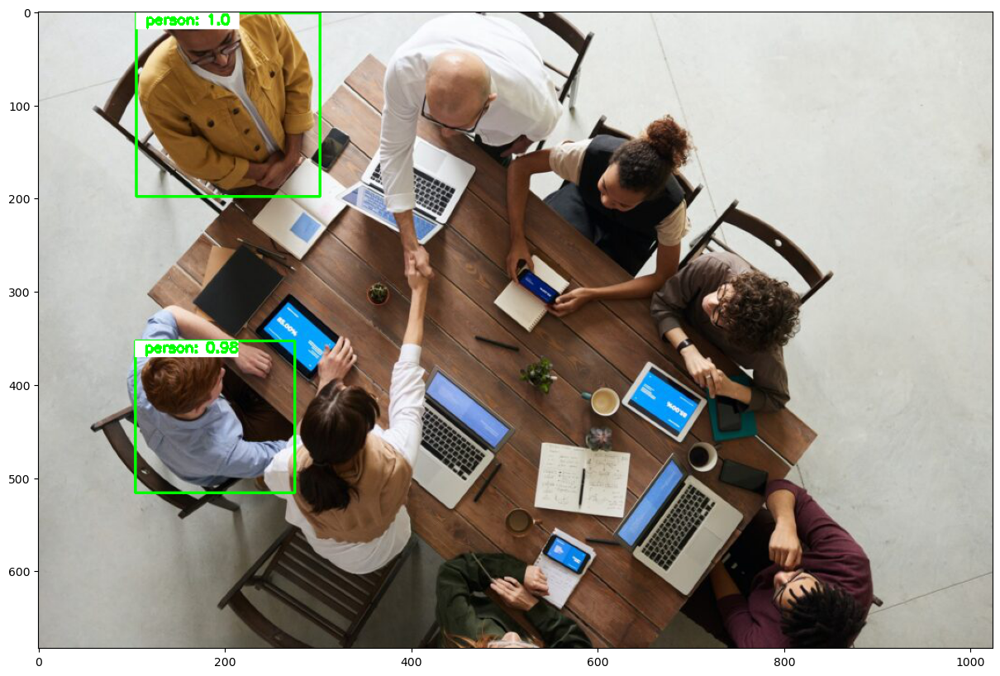

In [33]:
pred_thresh=get_predictions(pred, threshold=0.98, objects="person")
draw_box(pred_thresh, img, download_image=True, img_name="andrew_BOX")
del pred_thresh

In [34]:
save_RAM(image_=True)

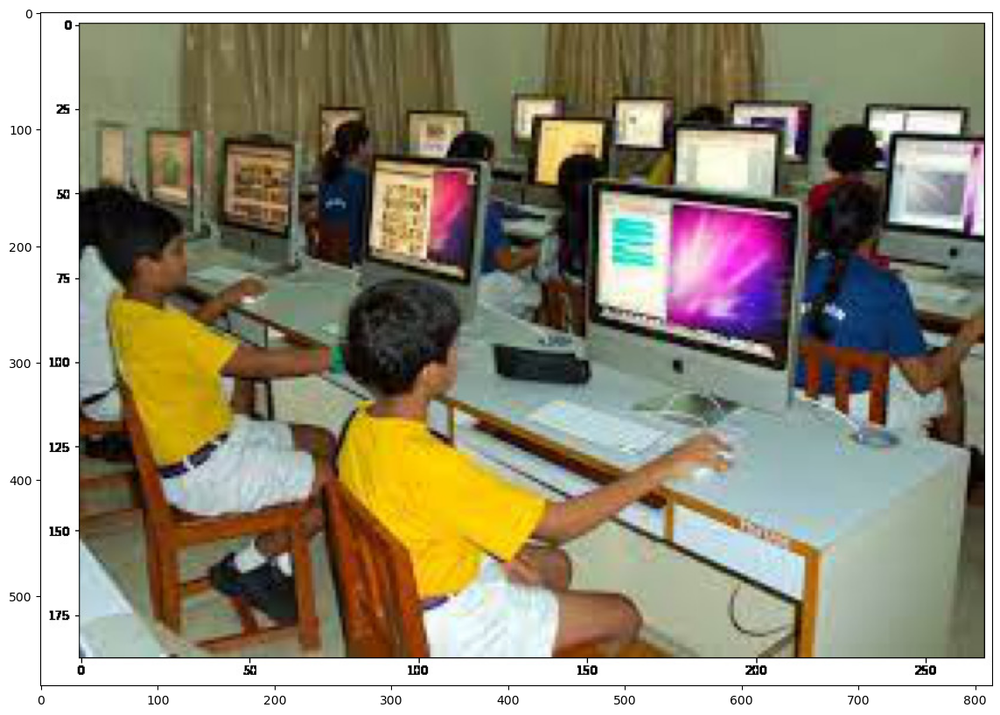

In [36]:
img_path='obj2.jpeg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()


Label: tv
Box coordinates: 720, 102, 806, 198
Probability: 0.9964401125907898

Label: tv
Box coordinates: 467, 149, 651, 313
Probability: 0.9881112575531006

Label: person
Box coordinates: 43, 155, 256, 508
Probability: 0.9853217601776123

Label: person
Box coordinates: 237, 233, 568, 541
Probability: 0.9836854934692383

Label: person
Box coordinates: 645, 96, 775, 353
Probability: 0.9833161234855652

Label: tv
Box coordinates: 537, 97, 637, 161
Probability: 0.9564979076385498

Label: chair
Box coordinates: 63, 256, 248, 541
Probability: 0.9404308199882507

Label: tv
Box coordinates: 592, 75, 659, 134
Probability: 0.8315711617469788

Label: tv
Box coordinates: 419, 89, 487, 151
Probability: 0.8242101073265076

Label: tv
Box coordinates: 403, 69, 448, 123
Probability: 0.8033720850944519


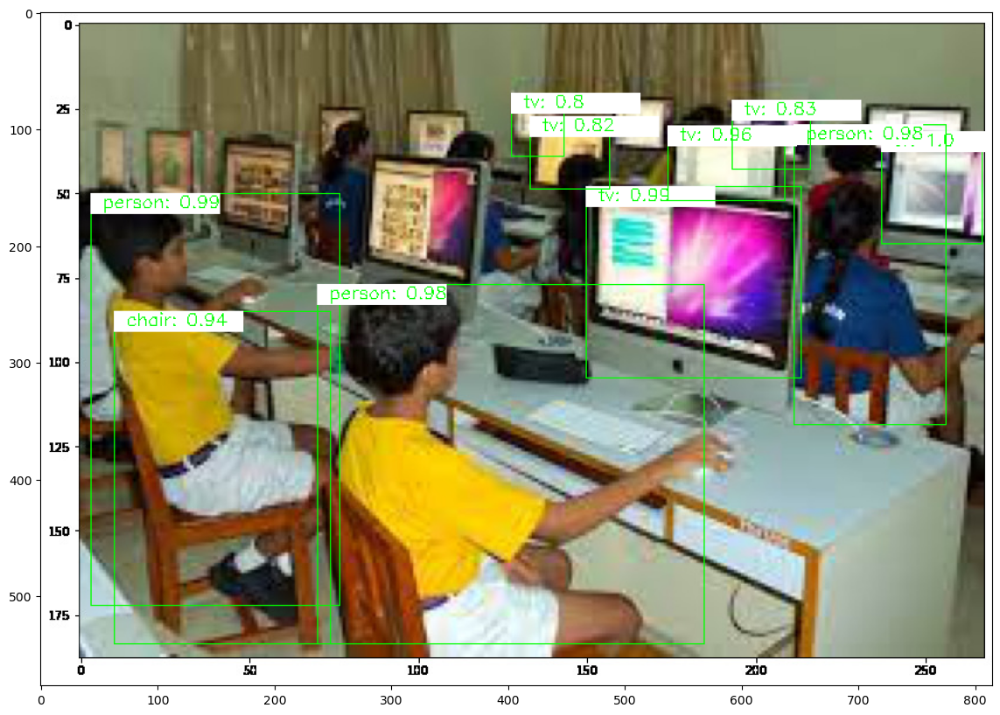

In [37]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.8)
draw_box(pred_thresh, img, rect_th=1, text_size= 0.5, text_th=1)

del pred_thresh


Label: person
Box coordinates: 43, 155, 256, 508
Probability: 0.9853217601776123

Label: person
Box coordinates: 237, 233, 568, 541
Probability: 0.9836854934692383

Label: person
Box coordinates: 645, 96, 775, 353
Probability: 0.9833161234855652


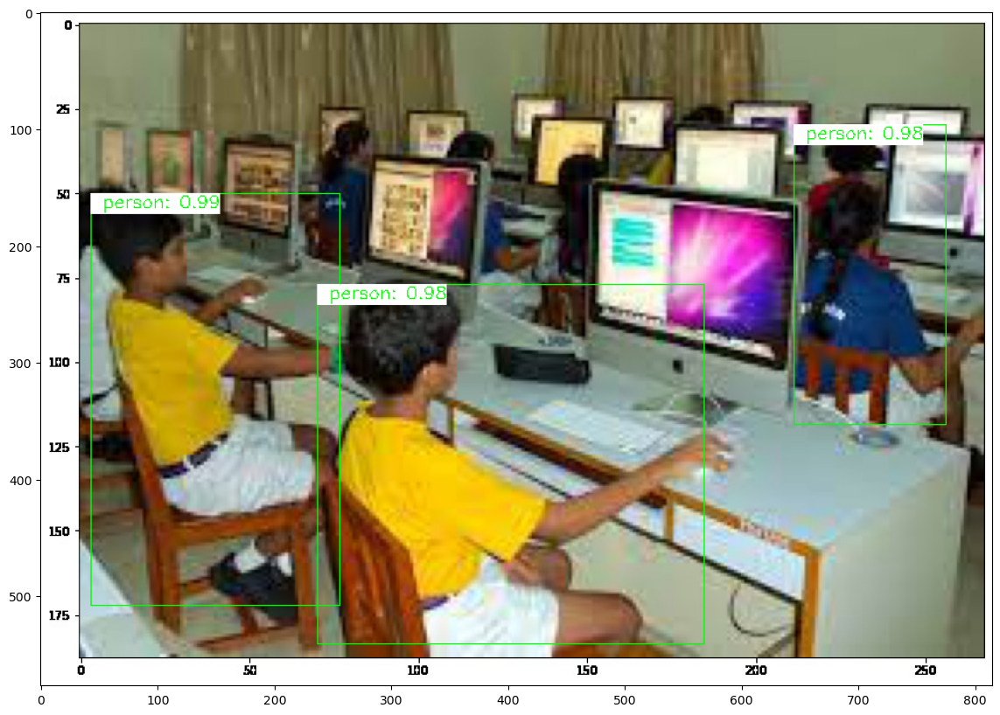

In [38]:
pred_obj=get_predictions(pred,objects="person")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="dl_guys_IBM_BOX")

del pred_obj


Label: tv
Box coordinates: 720, 102, 806, 198
Probability: 0.9964401125907898

Label: tv
Box coordinates: 467, 149, 651, 313
Probability: 0.9881112575531006

Label: person
Box coordinates: 43, 155, 256, 508
Probability: 0.9853217601776123

Label: person
Box coordinates: 237, 233, 568, 541
Probability: 0.9836854934692383

Label: person
Box coordinates: 645, 96, 775, 353
Probability: 0.9833161234855652

Label: tv
Box coordinates: 537, 97, 637, 161
Probability: 0.9564979076385498

Label: chair
Box coordinates: 63, 256, 248, 541
Probability: 0.9404308199882507

Label: tv
Box coordinates: 592, 75, 659, 134
Probability: 0.8315711617469788

Label: tv
Box coordinates: 419, 89, 487, 151
Probability: 0.8242101073265076

Label: tv
Box coordinates: 403, 69, 448, 123
Probability: 0.8033720850944519

Label: person
Box coordinates: 337, 104, 434, 221
Probability: 0.7794309854507446

Label: tv
Box coordinates: 277, 127, 376, 239
Probability: 0.6781585216522217

Label: dining table
Box coordinates: 36

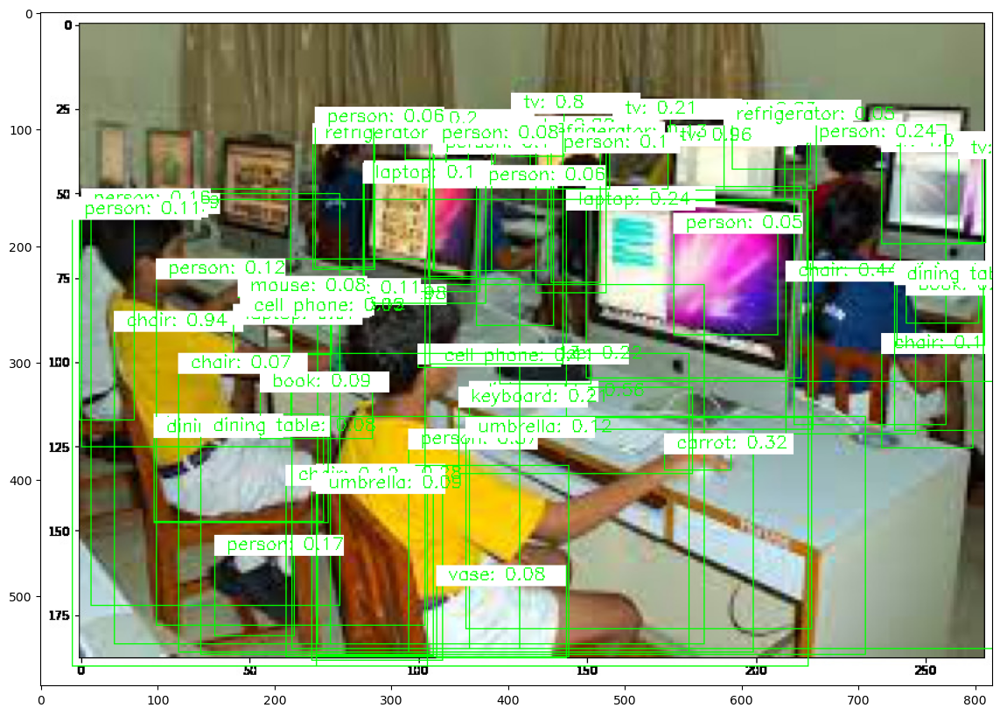

In [39]:
pred_thresh=get_predictions(pred,threshold=0.01)
draw_box(pred_thresh, img, rect_th= 1, text_size=0.5, text_th=1)

del pred_thresh

In [40]:
save_RAM(image_=True)

# Object Detection:
    
In Object Detection we find the classes as well detect the objects in an image. Consider the following image

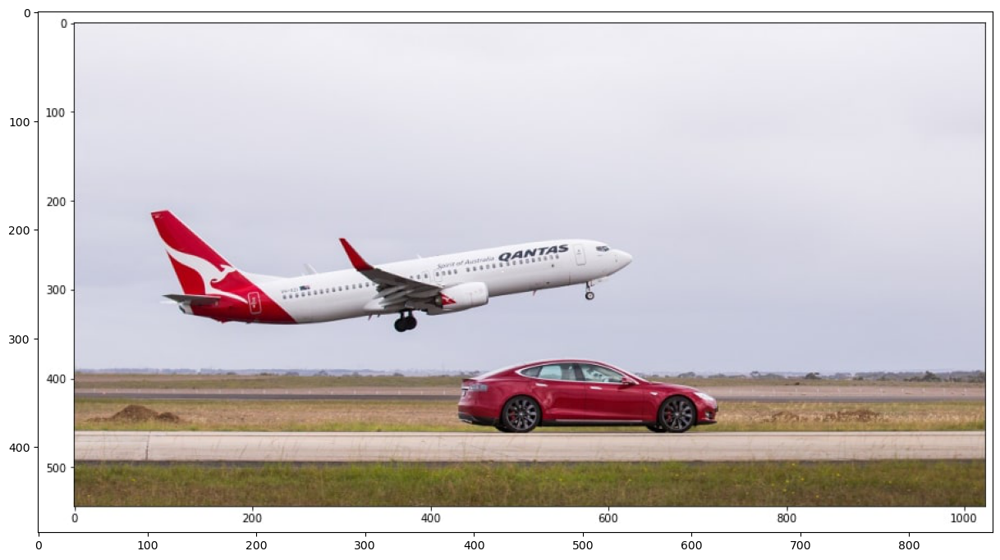

In [43]:
img_path='quantas-car-v-plane-TAKE-OFF.jpg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()
del img_path


Label: car
Box coordinates: 380, 319, 623, 387
Probability: 0.9996297359466553

Label: airplane
Box coordinates: 85, 185, 535, 298
Probability: 0.9991655349731445


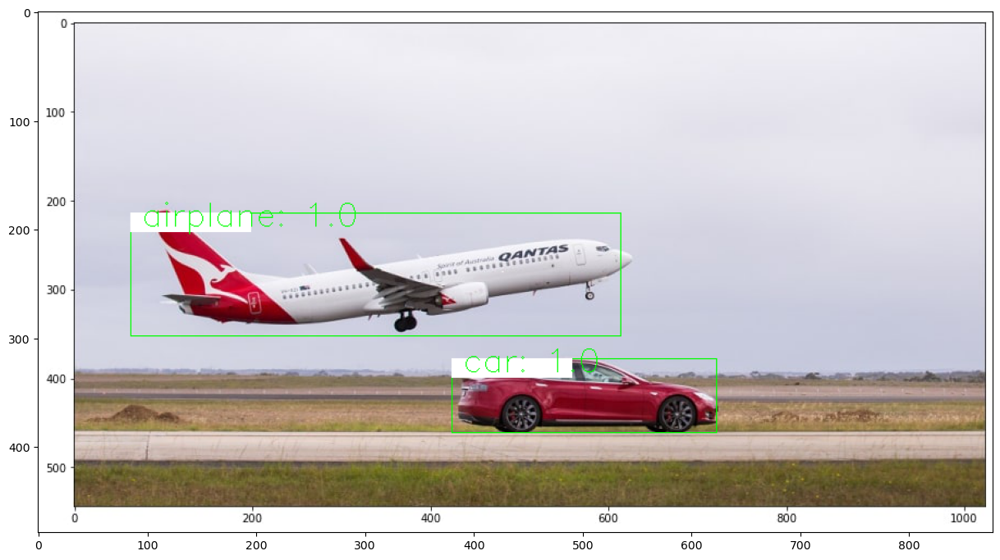

In [44]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred,threshold=0.97)
draw_box(pred_thresh,img,rect_th=1, text_size=1, text_th=1, download_image=True, img_name="dog_cat_bird_BOX")

del pred_thresh

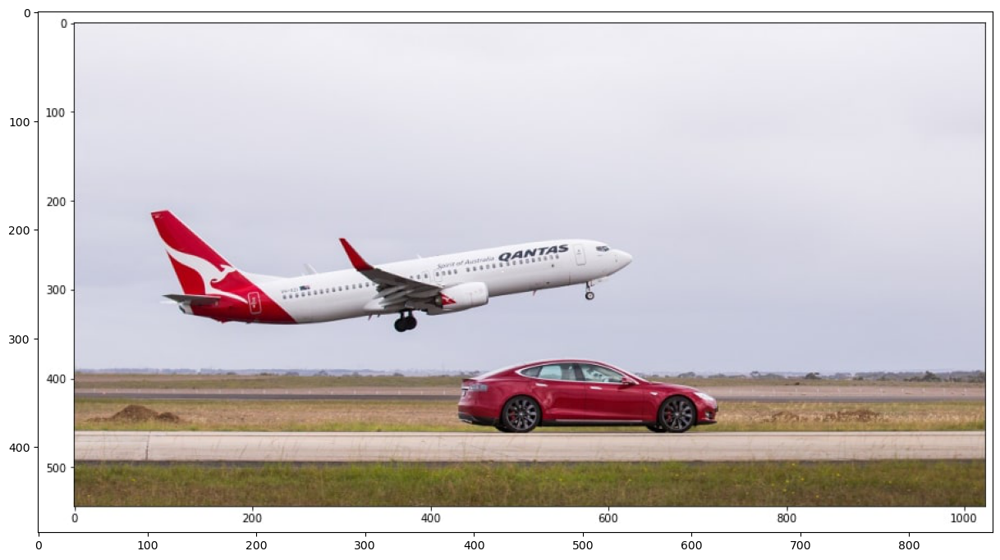

In [45]:
# img = transform(image)
# pred = model([img])
pred_obj=get_predictions(pred, objects=["dog","cat"])
draw_box(pred_obj, img,rect_th=1, text_size= 0.5, text_th=1)
del pred_obj

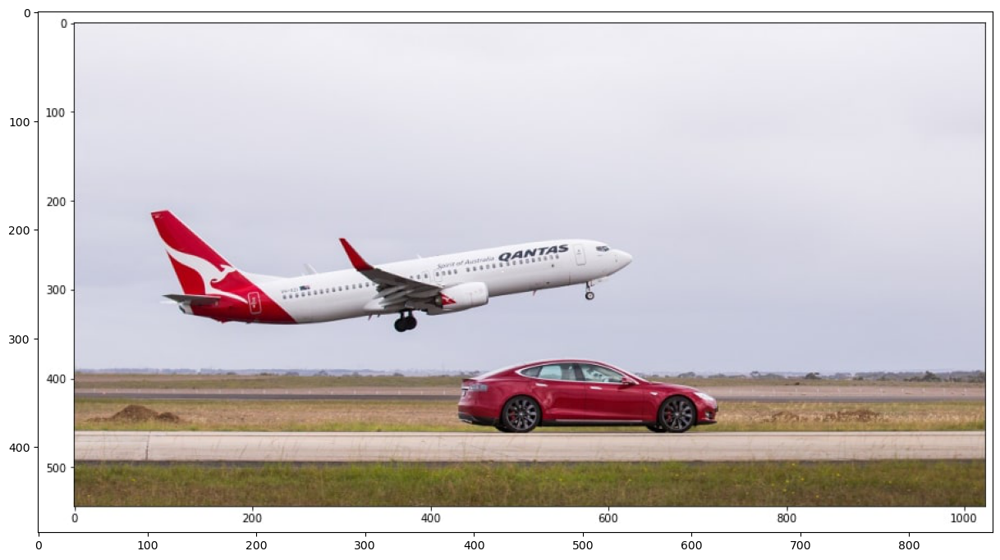

In [46]:
# img = transform(image)
# pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.70, objects=["dog", "cat"])
draw_box(pred_thresh, img, rect_th= 1, text_size=1, text_th=1)

del pred_thresh

In [47]:
save_RAM(image_=True)

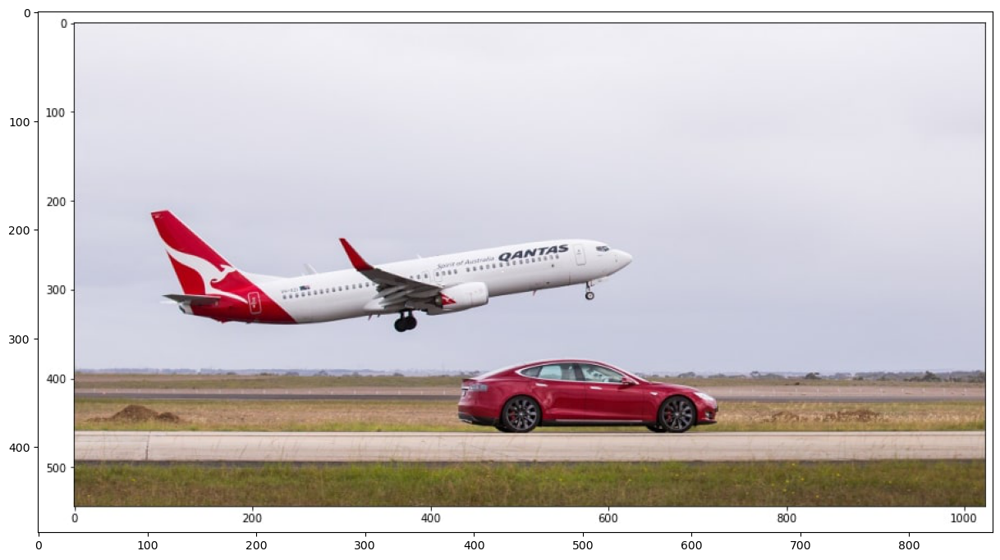

In [48]:
img_path='quantas-car-v-plane-TAKE-OFF.jpg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()
del img_path


Label: car
Box coordinates: 380, 319, 623, 387
Probability: 0.9996297359466553

Label: airplane
Box coordinates: 85, 185, 535, 298
Probability: 0.9991655349731445


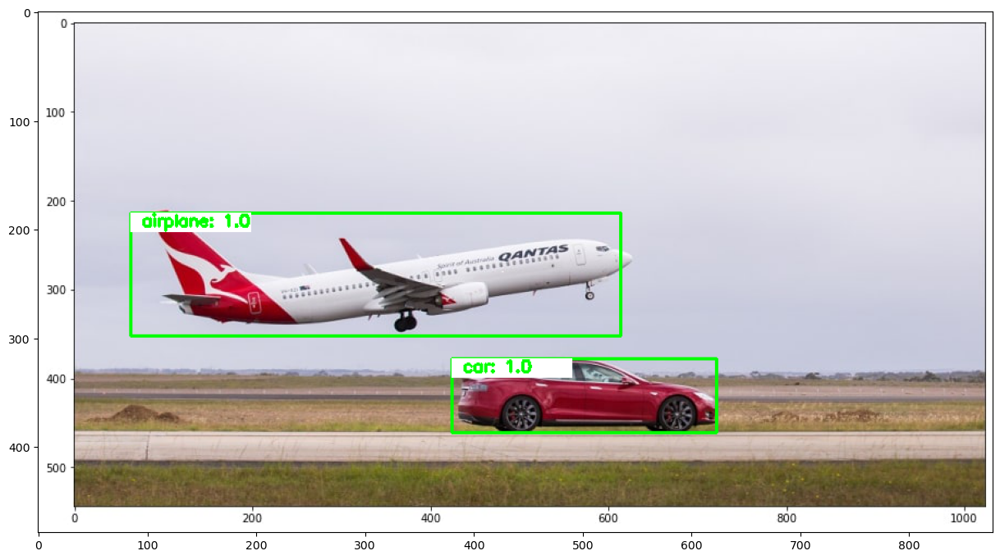

In [49]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.997)
draw_box(pred_thresh, img, download_image=True, img_name="car_plane_BOX")
del pred_thresh

In [50]:
save_RAM(image_=True)

# Test Model With an Uploaded Image:
    
Replace with the name of your image as seen in your directory into img_path variable.

In [51]:
from pathlib import Path
print("Directory Path:", Path().absolute())

Directory Path: F:\AIML_Mphasis\AIML_With_Python\Deep Learning


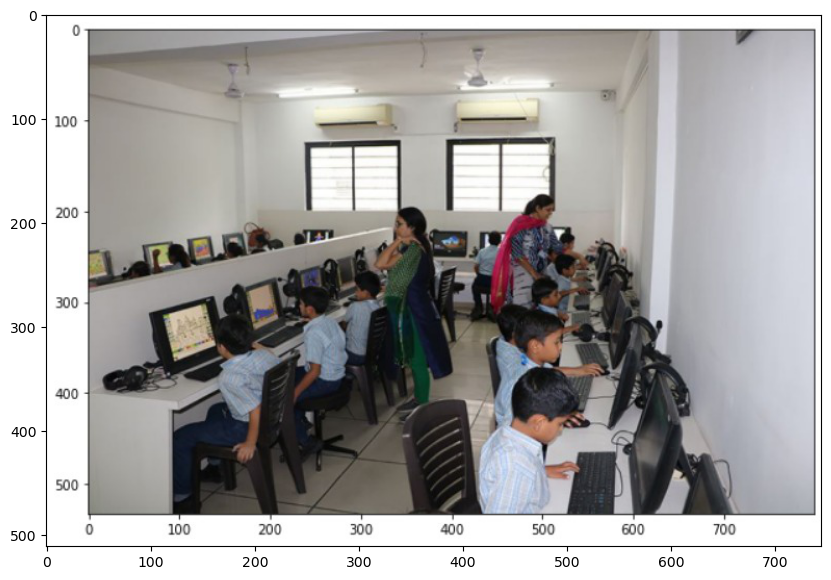

In [53]:
img_path = 'classroom.jpeg'
image = Image.open(img_path)
plt.figure(figsize=(10, 15))
plt.imshow(np.array(image))
plt.show()


Label: person
Box coordinates: 414, 347, 526, 480
Probability: 0.9849453568458557

Label: tv
Box coordinates: 102, 272, 169, 344
Probability: 0.9831598401069641

Label: person
Box coordinates: 428, 282, 540, 397
Probability: 0.9827378392219543

Label: person
Box coordinates: 315, 186, 381, 373
Probability: 0.9761768579483032

Label: tv
Box coordinates: 370, 207, 406, 233
Probability: 0.9732313752174377

Label: person
Box coordinates: 234, 266, 293, 406
Probability: 0.9675561189651489

Label: person
Box coordinates: 408, 210, 438, 298
Probability: 0.9658759236335754

Label: chair
Box coordinates: 342, 373, 421, 481
Probability: 0.9627147316932678

Label: person
Box coordinates: 431, 172, 493, 291
Probability: 0.9569910168647766

Label: person
Box coordinates: 119, 288, 232, 473
Probability: 0.9542658925056458


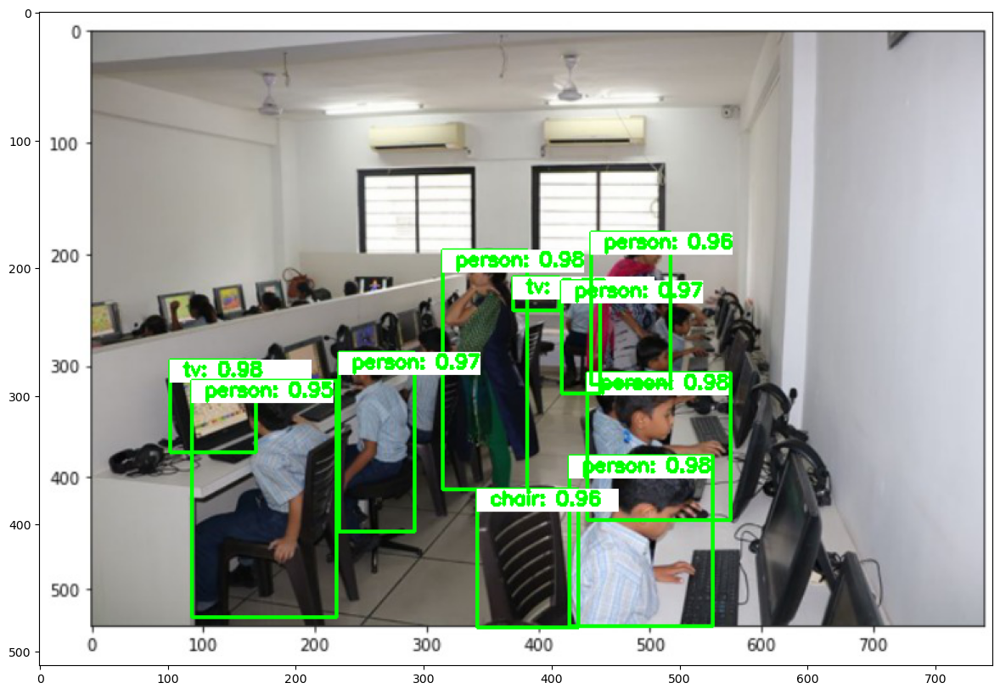

In [54]:
img = transform(image )
pred = model(img.unsqueeze(0))
pred_thresh=get_predictions(pred,threshold=0.95)
draw_box(pred_thresh, img, download_image=True, img_name="me_BOX")